In [1]:
# WorldQuantumGravity package address https://github.com/dj-26/World-Quantum-Gravity

In [2]:
using Pkg
#push!(LOAD_PATH, pwd())
#push!(LOAD_PATH, pwd()*"/World-Quantum-Gravity")

In [3]:
#Pkg.add("WorldQuantumGravity")
Pkg.add("GraphPlot")
Pkg.add("LightGraphs")
#Pkg.add("WorldQuantumGravity")

  Updating registry at `~/.julia/registries/General`
  Updating git-repo `https://github.com/JuliaRegistries/General.git`
 Resolving package versions...
  Updating `Project.toml`
 [no changes]
  Updating `Manifest.toml`
  [00ebfdb7] + CSTParser v1.0.0
  [34da2185] ↑ Compat v2.2.0 ⇒ v3.0.0
  [1914dd2f] ↓ MacroTools v0.5.2 ⇒ v0.5.1
  [0796e94c] + Tokenize v0.5.6
 Resolving package versions...
  Updating `Project.toml`
 [no changes]
  Updating `Manifest.toml`
  [00ebfdb7] - CSTParser v1.0.0
  [34da2185] ↓ Compat v3.0.0 ⇒ v2.2.0
  [1914dd2f] ↑ MacroTools v0.5.1 ⇒ v0.5.2
  [0796e94c] - Tokenize v0.5.6


In [4]:
using WorldQuantumGravity

# setup grid

In [5]:
lgs = (3,3)

(3, 3)

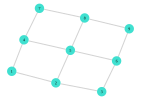

In [6]:
using LightGraphs
using GraphPlot

sk = gridGraph(lgs,0)
gplot(sk,nodelabel=1:nv(sk))

# evaluation - totally homogeneous

In [7]:
# set homogeneous (same values in bulk and on boundary) spacetime configurations

function svalueHom(sv)
    d = length(lgs)
    return fill(sv,(gridSize(lgs, d),d))
end

function cvalueHom(cv)
    d = length(lgs)
    return fill(cv,(gridSize(lgs, d),d))
end

cvalueHom (generic function with 1 method)

In [8]:
#sv = 1.0 # length configuration
cv = 0.0 # curvature configuration
a = 1.0 # gravitational constant
L = 0.0 # "cosmological constant"

[ampVG(lgs, svalueHom(sv), cvalueHom(cv), a, L) for sv in 0.0:.1:1.5]

16-element Array{Float64,1}:
      1.0                   
      9.120108393559107     
    483.10865345483967      
  32936.114153947965        
      1.295264710121194e6   
      1.677721600000006e7   
      4.646145292197968e7   
      1.9345866999673758e7  
 899810.7952855402          
   3614.951425425695        
      1.0                   
      1.5553412561728634e-5 
      1.1323600694293469e-11
      3.264604100155062e-19 
      3.1955734688332187e-28
      9.210602585224086e-39 

# evaluation - homogeneous bulk

In [9]:
# [[remove duplicate entries?]]

function listNeighborEdgevv(l)
    list = Edgevv[]
    for i in l, j in neighbors(sk,i)
        push!(list, Edgevv(i,j))
    end
    list
end

lbvs = lgs.-2 # listBulkVertexSize
lbv = [lbl(lgs, Coord(CartesianIndices(lbvs)[i].I)) for i in 1:prod(lbvs)] # bulk vertices
lbevd = [edgeVD(lgs, listNeighborEdgevv(lbv)[i]) for i in 1:length(listNeighborEdgevv(lbv))]; # bulk edges as (vertex,direction)

In [10]:
# amplitude homogeneous bulk
function ampVGHomBulk(lgs, svalue, cvalue, bulks, bulkc, a, L)
    for i in 1:length(lbevd)
        svalue[lbevd[i].vert...] = bulks
        cvalue[lbevd[i].vert...] = bulkc
    end
    ampVG(lgs, svalue, cvalue, a, L)
end

# "caustic restriction"
function smax(c,dspac) #dspc is SPATIAL dimension
    pi*sqrt(dspac/c)
end

# amplitude homogeneous bulk with caustic restriction
function ampVGHomBulkRes(lgs, svalue, cvalue, bulks, bulkc, a, L)    
    if bulks <= smax(bulkc,length(lgs)-1)
        return ampVGHomBulk(lgs, svalue, cvalue, bulks, bulkc, a, L)
    else
        return 0
    end
end

ampVGHomBulkRes (generic function with 1 method)

In [11]:
using Plots

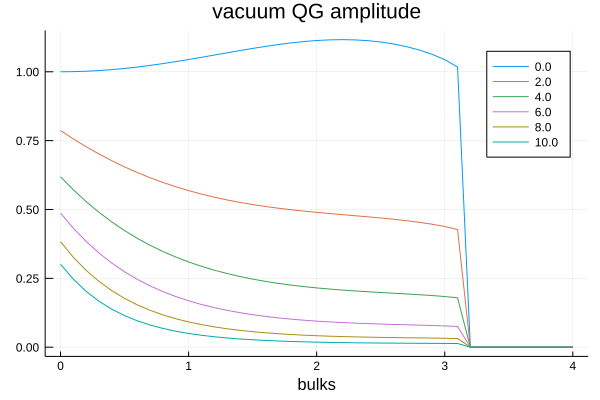

In [12]:
# different cosmological constants

listVariable = 0.0:2.0:10.0

a = 10.0^(-2)
sv = 1.0 #boundary s
cv = 0.0 #boundary c
bulkc = 1.0

xend = 4.0
x = 0.0:.1:xend # bulk s
y = [ampVGHomBulkRes(lgs, svalueHom(sv), svalueHom(cv), bulks, bulkc, a, L) for bulks in x, L in listVariable]

plot(x,y,title="vacuum QG amplitude",label=collect(listVariable),lw=1)
xlabel!("bulks")

In [13]:
# amplitudes for homogeneous bulk configurations with caustic restriction

function plotamp(bulks,bulkc)
    a = 1.0
    L = 0.0
    sv = 1.0 #boundary s
    cv = 0.0 #boundary c
    return ampVGHomBulkRes(lgs, svalueHom(sv), svalueHom(cv), bulks, bulkc, a, L)   
end

#x= [0.0:1.0:20.0;]; y= [0.0:1.0:20.0;]; 
x= [0.0:0.1:10.0;]; y= [0.0:0.1:10.0;]; 


#pl= plot(x, y, plotamp, camera=(60,60), title="vacuum QG amplitude", seriestype=:wireframe, size=[800,500]);
#plot(pl)
#xlabel!("bulks")
#ylabel!("bulkc")

In [14]:
#x= [0.0:0.1:10.0;]; y= [0.0:0.1:10.0;]; 
#heatmap(x, y, plotamp, title="vacuum QG amplitude");
#xlabel!("bulks")
#ylabel!("bulkc")

In [15]:
using Printf

In [16]:
function log_amp(bulks, bulkc)
    if bulks < 0
        return -Inf
    end
    if bulkc < 0
        return -Inf
    end
    a = 1.0
    L = 0.0
    sv = 1.0 #boundary s
    cv = 0.0 #boundary c
    return log(ampVGHomBulkRes(lgs, svalueHom(sv), svalueHom(cv), bulks, bulkc, a, L))
end
function log_amp(arr)
    #@printf("log_amp %f %f\n", arr[1], arr[2]);
    return log_amp(arr[1], arr[2])
end

log_amp (generic function with 2 methods)

In [17]:
log_amp(1.0, 5.0)

11.02574420754713

In [18]:
#x= [0.0:0.1:10.0;]; y= [0.0:0.1:10.0;]; 
#heatmap(x, y, log_amp, title="vacuum QG amplitude");
#xlabel!("bulks")
#ylabel!("bulkc")

In [19]:
push!(LOAD_PATH, "..")

4-element Array{String,1}:
 "@"      
 "@v#.#"  
 "@stdlib"
 ".."     

In [20]:
using emcee

┌ Info: Precompiling emcee [6ffcc990-0d4a-11ea-1051-736846a87456]
└ @ Base loading.jl:1186


In [21]:
nwalkers = 20
ndim = 2
lnprob_func = log_amp
sampler=Sampler(nwalkers, ndim, lnprob_func)

nwalkers: 20
ndim:     2
a:        2.0


In [22]:
pstart=zeros(nwalkers, ndim)
for i = 1:nwalkers
    pstart[i,1] = rand(Float64)
    pstart[i,2] = rand(Float64)
end

In [23]:
burnin=1000
nstep=1000
plast,lnplast = sample!(sampler, pstart, burnin)
p,lnp = sample!(sampler, plast, nstep, lnprob=lnplast)


([0.0299889 5581.56; 0.0209546 10395.5; … ; 0.0381322 2018.41; 0.149149 217.228], [11.023, 11.0068, 10.8508, 7.86662, 10.1598, 11.0364, 10.89, 9.51397, 10.7306, 10.3251, 9.66566, 10.982, 11.0015, 10.7568, 10.7617, 10.8763, 10.9242, 10.6788, 9.50798, 11.0364])

In [24]:
chain=flatchain(sampler);

In [25]:
size(chain)

(20000, 2)

In [26]:
ss = chain[:,1]
cc = chain[:,2]

#histogram2d(chain[:,1], chain[:,2], xlim=(0,10), ylim=(0,10))

20000-element Array{Float64,1}:
  107.09551638802897  
  172.37508993377355  
  151.3848667523754   
    1.7145680053345957
    0.6210923850189913
   21.8862767528281   
   10.352620378035372 
    0.3284271536997464
  225.8642520117314   
    0.8412250348249295
  161.95535097841338  
    3.9082660875006425
    3.84292091897006  
    ⋮                 
 3166.175317479193    
    0.2371002591619522
   41.008647772747736 
   45.862490269333186 
 1604.3940308567467   
  206.87432542954792  
 7162.277226645107    
   43.85267577188745  
    4.149487781202931 
   42.64930256256375  
 2018.4067038136332   
  217.22825173723194  

In [30]:
size(ss)

(20000,)

In [28]:
#histogram2d(ss[:10:end], cc[:10:end], xlim=(0,10), ylim=(0,10))

In [31]:
size(cc)

(20000,)

In [34]:
ss

20000-element Array{Float64,1}:
 0.19382357658290517 
 0.17372989402061562 
 0.18532723949599872 
 1.5342848169530743  
 2.6589964819592415  
 0.4731801637098822  
 0.6880823573656295  
 3.2659773564087926  
 0.13207681237717042 
 2.549063612495798   
 0.1353485892637216  
 0.8689617462620415  
 1.1154440990484105  
 ⋮                   
 0.042514170118571414
 3.856362268045226   
 0.40515327358941705 
 0.31214105417441484 
 0.0532038981844925  
 0.13919664469646786 
 0.02367797467868106 
 0.353363640950223   
 1.1376879691123651  
 0.3024577048279391  
 0.0381321982375282  
 0.14914948210765333 

In [37]:
cc[1:10:end]

2000-element Array{Float64,1}:
  107.09551638802897 
  161.95535097841338 
  144.17673662773063 
  161.95535097841338 
  144.17673662773063 
  161.95535097841338 
  110.99017835537123 
  150.18233653200545 
  110.99017835537123 
  150.18233653200545 
  110.09131988566519 
  150.18233653200545 
  110.09131988566519 
    ⋮                
 6012.934968462994   
   19.861625890215464
 6012.934968462994   
   19.861625890215464
 6012.934968462994   
   19.861625890215464
 5581.561939172358   
   19.861625890215464
 5581.561939172358   
   19.861625890215464
 5581.561939172358   
   41.008647772747736

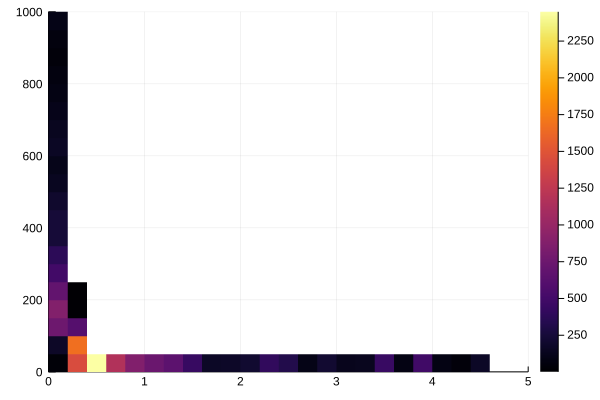

In [55]:
histogram2d(ss, cc, xlim=(0,5), ylim=(0,1000))

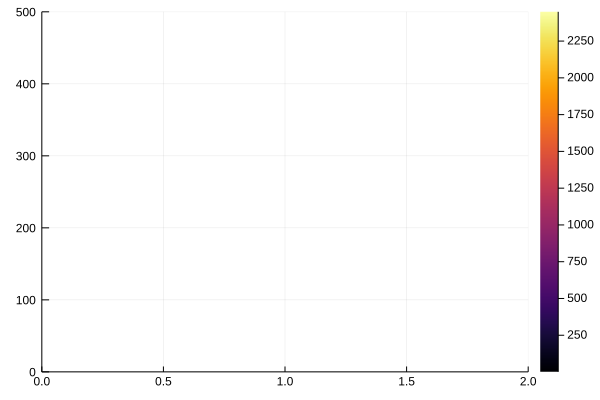

In [56]:
histogram2d(ss, cc, xlim=(0,2), ylim=(0,500))

In [57]:
histogram2d(ss, cc, xlim=(0,1), ylim=(0,100))

In [48]:
minimum(ss), maximum(ss)

(0.020208203131547843, 4.5408193234109255)

In [49]:
minimum(cc), maximum(cc)

(0.17224819761515464, 11449.75150651693)